In [2]:
import sys
if 'google.colab' in sys.modules:
    from open_atmos_jupyter_utils import pip_install_on_colab
    pip_install_on_colab('PyMPDATA-examples')

import numpy as np
from matplotlib import pyplot
from open_atmos_jupyter_utils import show_plot, show_anim
from PyMPDATA import ScalarField, Solver, Stepper, VectorField, Options, boundary_conditions
from matplotlib.ticker import MaxNLocator

In [3]:
class ShallowWaterEquationsIntegrator:
    def __init__(self, *, h_initial: np.ndarray, bathymetry:np.ndarray, options: Options = None):
        self.bathymetry = bathymetry
        """ initializes the solvers for a given initial condition of `h` assuming zero momenta at t=0 """
        options = options or Options(nonoscillatory=True, infinite_gauge=True)
        X, Y, grid = 0, 1, h_initial.shape
        stepper = Stepper(options=options, grid=grid)
        kwargs = {
            'boundary_conditions': [boundary_conditions.Constant(value=0)] * len(grid),
            'halo': options.n_halo,
        }
        advectees = {
            "h": ScalarField(h_initial, **kwargs),
            "uh": ScalarField(np.zeros(grid), **kwargs),
            "vh": ScalarField(np.zeros(grid), **kwargs),
        }
        self.advector = VectorField((
                np.zeros((grid[X] + 1, grid[Y])),
                np.zeros((grid[X], grid[Y] + 1))
            ), **kwargs
        )
        self.solvers = { k: Solver(stepper, v, self.advector) for k, v in advectees.items() }

    def __getitem__(self, key):
        """ returns `key` advectee field of the current solver state """
        return self.solvers[key].advectee.get()
    
    def _apply_half_rhs(self, *, key, axis, g_times_dt_over_dxy):
        """ applies half of the source term in the given direction """
        self[key][:] -= .5 * g_times_dt_over_dxy * self['h'] * np.gradient(self['h']-self.bathymetry, axis=axis)

    def _update_courant_numbers(self, *, axis, key, mask, dt_over_dxy):
        """ computes the Courant number component from fluid column height and momenta fields """
        velocity = np.where(mask, np.nan, 0)
        momentum = self[key]
        np.divide(momentum, self['h'], where=mask, out=velocity)

        # using slices to ensure views (over copies)
        all = slice(None, None) 
        all_but_last = slice(None, -1)
        all_but_first_and_last = slice(1, -1)

        velocity_at_cell_boundaries = velocity[( 
            (all_but_last, all),
            (all, all_but_last),
        )[axis]] + np.diff(velocity, axis=axis) / 2 
        courant_number = self.advector.get_component(axis)[(
            (all_but_first_and_last, all),
            (all, all_but_first_and_last)
        )[axis]]
        courant_number[:] = velocity_at_cell_boundaries * dt_over_dxy[axis]
        assert np.amax(np.abs(courant_number)) <= 1

    def __call__(self, *, nt: int, g: float, dt_over_dxy: tuple, outfreq: int, eps: float=1e-7):
        """ integrates `nt` timesteps and returns a dictionary of solver states recorded every `outfreq` step[s] """
        output = {k: [] for k in self.solvers.keys()}
        for it in range(nt + 1): 
            if it != 0:
                mask = self['h'] > eps
                for axis, key in enumerate(("uh", "vh")):
                    self._update_courant_numbers(axis=axis, key=key, mask=mask, dt_over_dxy=dt_over_dxy)
                self.solvers["h"].advance(n_steps=1)
                for axis, key in enumerate(("uh", "vh")):
                    self._apply_half_rhs(key=key, axis=axis, g_times_dt_over_dxy=g * dt_over_dxy[axis])
                    self.solvers[key].advance(n_steps=1)
                    self._apply_half_rhs(key=key, axis=axis, g_times_dt_over_dxy=g * dt_over_dxy[axis])
            if it % outfreq == 0:
                for key in self.solvers.keys():
                    output[key].append(self[key].copy())
        return output

Czy obecność wraku w wodzie 2.5 km od brzegu pozostawia mierzalną różnicę w profilu fali docierającej do linii brzegowej?

Celem jest weryfikacja, czy zjawisko ugięcia się fali na wraku (opóźnienia nad płytszym obszarem) jest na tyle silne by na dystansie 2.5 km zostać zarejestrowane przez wirtualne czujniki na brzegu. Taka sytuacja występuje na ujściu Tamizy gdzie znajduje się zatopiony statek SS Richard Montgomery. Niestety ze względów numerycznych, rozmiary statka musiały zostać zmodyfikowane, aby mogły zostać zarejestrowane w symulacji (oryginalnie statek jest mniejszy, natomiast można "przyjąć", że wokół niego znajdują się także inne obiekty, np. skały) - w przypadku gdy statek miałby rzeczywiste rozmiary, wymagana byłaby redukcja rozdzielczości przestrzennej, która znacznie wydłużyłaby już i tak długi czas symulacji.

Statek (przybliżony poprzez kształ dwuwymiarowego gaussa o wymiarach około 240m długości i 120m szerokości) znajduje się 2.5 km od brzegu, na głębokości 17.5m a jego wysokość to 16m. Batymetria układu zmienia się od -20m z kierunku morza, do 5m na brzegu. Z kierunku morza płynie pojedyncza fala z prędkością około 50km/h (c=$\sqrt(g \cdot H)$) i amplitudzie 1.5m, która natrafia na wrak statku w wyniku czego ugina się, propagując dalej w kierunku brzegu.

Krok siatki ustawiono jako $\Delta x = \Delta y = $ 10m a jej rozmiar to 3km od morza do brzegu, oraz 2km rozciągłości brzegu (300x200), krok czasowy to $\Delta t = 0.1 s$

In [4]:
# 1. Parametry siatki i statku

Lx = 3000.0  
Ly = 2000.0  
g = 9.81

# Parametry Wraku (SS Richard Montgomery)
ship_x = 500.0   # Rzeczywista pozycja 
ship_y = 1000.0 

# Wymiary Wraku
sigma_length = 60.0  # Długość ~240m
sigma_width = 30.0   # Szerokość ~120m


In [5]:
# 2. DEFINICJA FUNKCJI SYMULACJI

def run_simulation(scale=1.0):
    """
    scale=1.0 -> Siatka standardowa (dx=10m)
    scale=2.0 -> Siatka zagęszczona (dx=5m) - do testu zbieżności
    """
    # 1. SIATKA
    base_dx = 10.0
    dx_val = base_dx / scale
    dy_val = base_dx / scale
    
    nx = int(Lx / dx_val)
    ny = int(Ly / dy_val)
    grid = (nx, ny)
    
    x = np.linspace(0, Lx, nx)
    y = np.linspace(0, Ly, ny)
    X, Y = np.meshgrid(x, y, indexing='ij')

    # BATYMETRIA
    depth_sea = 20.0
    depth_shore = 5.0
    bathymetry_base = depth_sea - (depth_sea - depth_shore) * (X / Lx)

    # Kształt statku (Gauss)
    ship_shape = np.exp(-((X - ship_x)**2 / (2 * sigma_width**2) + (Y - ship_y)**2 / (2 * sigma_length**2)))
    local_depth_at_wreck = depth_sea - (depth_sea - depth_shore) * (ship_x / Lx)
    
    ship_height = local_depth_at_wreck - 1.5 
    
    bathymetry = np.maximum(bathymetry_base - (ship_height * ship_shape), 0.5)

    # 3. WARUNEK POCZĄTKOWY FALI PŁASKIEJ
    zeta = np.zeros(grid, dtype=float)
    wave_pos = 200.0       
    wave_width = 100.0   
    Amplitude = 1.5       

    zeta = Amplitude * np.exp(-((X - wave_pos)**2) / (2 * wave_width**2))
    h_initial = bathymetry + zeta
    
    # Nadanie pędu w prawo
    u_initial = zeta * np.sqrt(g / bathymetry)
    uh_initial = u_initial * h_initial

    
    base_dt = 0.1 
    dt_val = base_dt / scale 
    
    total_physical_time = 300.0
    total_time_steps = int(total_physical_time / dt_val)
    
    output_interval = int(2.0 / dt_val)

    print(f"Start symulacji, skala={scale}x (siatka: {nx}x{ny}, dt={dt_val:.3f}s)")

    integrator = ShallowWaterEquationsIntegrator(h_initial=h_initial, bathymetry=bathymetry)
    integrator['uh'][:] = uh_initial 

    output = integrator(
        nt=total_time_steps, 
        g=g, 
        dt_over_dxy=(dt_val/dx_val, dt_val/dy_val), 
        outfreq=output_interval
    )
    
    # 5. test zbieżności
    # Sonda 200m za wrakiem 
    sensor_x_pos = 700.0
    idx_x = int(sensor_x_pos / dx_val)
    idx_x = min(idx_x, nx - 1)
    idx_y = ny // 2 
    
    signal = [frame[idx_x, idx_y] - bathymetry[idx_x, idx_y] for frame in output['h']]
    time_axis = np.arange(len(signal)) * output_interval * dt_val

    return output, bathymetry, X, Y, signal, time_axis, dx_val, dt_val, output_interval

In [6]:
# Symulacja podstawowa (1x) - Dane do wizualizacji
print("Obliczenia dla siatki podstawowej (1x)")
output, bathymetry, X, Y, signal_1x, time_1x, dx_val, dt_val, output_interval = run_simulation(scale=1.0)

# Symulacja zagęszczona (2x) - wykres zbieżności
print("Obliczenia dla siatki zagęszczonej (2x)")
_, _, _, _, signal_2x, time_2x, dx_2x, _, _ = run_simulation(scale=2.0)


Obliczenia dla siatki podstawowej (1x)
Start symulacji, skala=1.0x (siatka: 300x200, dt=0.100s)
Obliczenia dla siatki zagęszczonej (2x)
Start symulacji, skala=2.0x (siatka: 600x400, dt=0.050s)



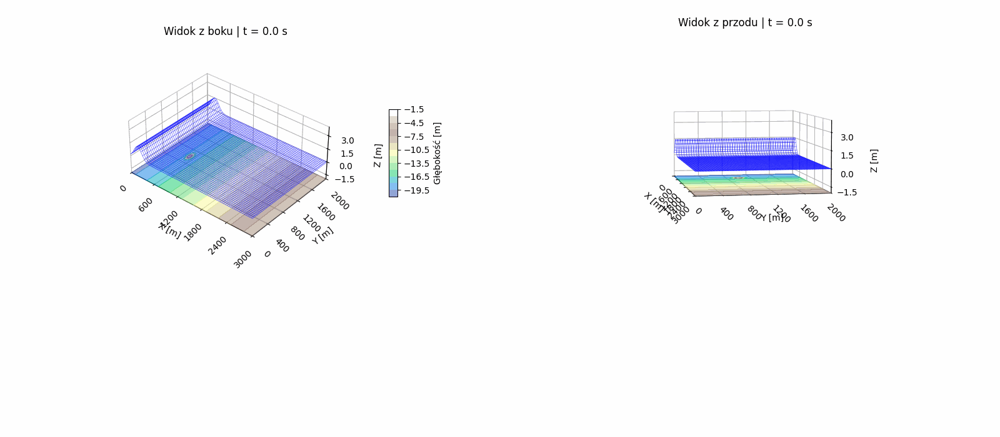

HTML(value="<a href='.\\tmpzu0mgfk2.gif' target='_blank'>.\\tmpzu0mgfk2.gif</a><br>")

In [7]:
def plot_3d(frame, *, zlim=(-2.0, 4.0)):
    time_sec = frame * output_interval * dt_val
    h_total = output['h'][frame]
    current_zeta = h_total - bathymetry
    
    fig = pyplot.figure(figsize=(16, 7))
    
    views = [
        ("Widok z boku", 35, -50),
        ("Widok z przodu", 5, -10) 
    ]
    
    for i, (title, elev, azim) in enumerate(views):
        ax = fig.add_subplot(1, 2, i+1, projection='3d')
        
        ax.plot_wireframe(X, Y, current_zeta, rstride=4, cstride=4, color='blue', linewidth=0.5, alpha=0.6)

        cset = ax.contourf(
            X, Y, -bathymetry, 
            zdir='z', offset=zlim[0], 
            cmap='terrain', levels=15, alpha=0.5
        )
        
        ax.contour(
            X.T, Y.T, -bathymetry.T, 
            zdir='z', offset=zlim[0],
            levels=[-4.0], colors='red', linewidths=2.0
        )

        ax.set_title(f"{title} | t = {time_sec:.1f} s", pad=20)
        
    
        ax.set_xlabel("X [m]", labelpad=10)
        ax.set_ylabel("Y [m]", labelpad=10)
        ax.set_zlabel("Z [m]", labelpad=10)
        
        ax.set_zlim(zlim)
        ax.set_xlim(0, Lx)
        ax.set_ylim(0, Ly)
        
        ax.xaxis.set_major_locator(MaxNLocator(5))
        ax.yaxis.set_major_locator(MaxNLocator(5))
        ax.zaxis.set_major_locator(MaxNLocator(4))
        
        ax.tick_params(axis='x', rotation=45, pad=5)
        ax.tick_params(axis='y', rotation=-45, pad=5)

        for axis in (ax.xaxis, ax.yaxis, ax.zaxis):
            axis.pane.fill = False
            axis.pane.set_edgecolor('black')
            axis.pane.set_alpha(0.2)

        ax.set_box_aspect((2.0, 1.5, 0.8)) 
        ax.view_init(elev=elev, azim=azim)
        
        if i == 0:
            cb = fig.colorbar(cset, ax=ax, shrink=0.4, aspect=10, pad=0.2)
            cb.set_label('Głębokość [m]')

    fig.subplots_adjust(bottom=0.4, wspace=0.5, top=0.9)

    return fig

show_anim(plot_3d, range(len(output['h'])))

Symulacje przedstawiono na wykresie 3D, przy pomoc dwóch rzutów, na pierwszym z nich widać zaburzenie powstałe w wyniku zderzenia fali z wrakiem, które utrzymuje się za falą. Na drugim natomiast widać zmianę czoła fali oraz wzrost jej wysokości w związku z przypływem na brzeg. Prędkość czoła fali, zależy od wysokości a zatem w miejscu, gdzie doszło do zderzenia czoło fali osiąga mniejszą prędkość niż reszta fali. Z tego powodu powstają różnice w prędkościach w różnych częściach fali, przez co jej kształt ulega deformacji.

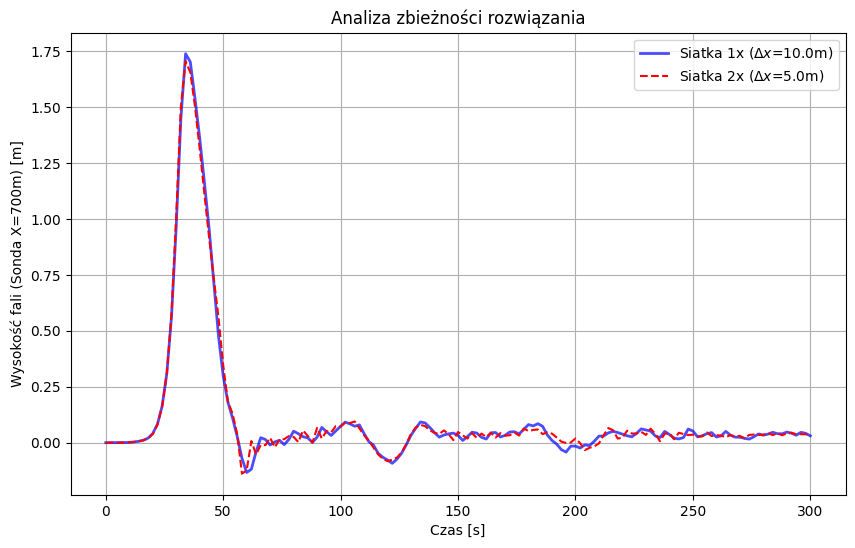

In [8]:
# 4. ANALIZA ZBIEŻNOŚCI 
def plot_zbieznosc():
    fig, ax = pyplot.subplots(figsize=(10, 6))
    
    ax.plot(time_1x, signal_1x, 'b-', label=fr'Siatka 1x ($\Delta x$={dx_val:.1f}m)', linewidth=2, alpha=0.7)
    
    min_len = min(len(time_1x), len(time_2x))
    ax.plot(time_2x[:min_len], signal_2x[:min_len], 'r--', label=fr'Siatka 2x ($\Delta x$={dx_2x:.1f}m)', linewidth=1.5)
    
    ax.set_title("Analiza zbieżności rozwiązania")
    ax.set_xlabel("Czas [s]")
    ax.set_ylabel("Wysokość fali (Sonda X=700m) [m]")
    ax.legend()
    ax.grid(True)
    pyplot.show()

plot_zbieznosc()

Wykonano także analizę zbieżności rozwiązania poprzez wykonanie takiej samej symulacji z dwukrotnie mniejszym krokiem siatki (czterokrotny wzrost liczby punktów siatki), oraz dwukrotnie mniejszym krokiem czasowym. Wykonano to za pomocą wirtualnej sondy umieszczonej 200m za wrakiem, która mierzyła wysokość wody w obu symulacjach. Linie pokrywają się, z wyjątkiem fluktuacji, które wynoszą kilka centymetrów, mogą one jednak zostać zaniedbane ze względu na ich małe wielkości - symulacja wykazuje zbieżność.


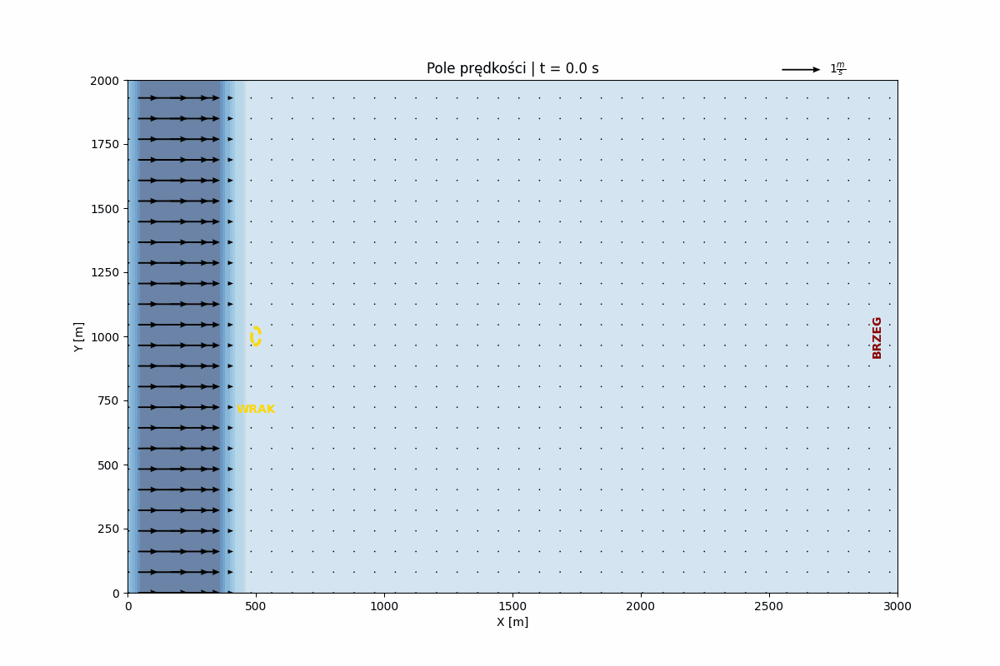

HTML(value="<a href='.\\tmp1tb7yapb.gif' target='_blank'>.\\tmp1tb7yapb.gif</a><br>")

In [9]:
# 5. POLE WEKTOROWE PRĘDKOŚCI
def plot_vectors(frame, *, stride=8): 
    
    h = output['h'][frame]   
    uh = output['uh'][frame] 
    vh = output['vh'][frame] 
    
    u = uh / (h + 1e-6)
    v = vh / (h + 1e-6)
    
    X_sub = X[::stride, ::stride]
    Y_sub = Y[::stride, ::stride]
    U_sub = u[::stride, ::stride]
    V_sub = v[::stride, ::stride]
    
    fig, ax = pyplot.subplots(figsize=(12, 8))
    
    # Tło
    surface_anomaly = h - bathymetry
    im = ax.imshow(
        surface_anomaly.T, 
        origin='lower', 
        extent=[0, Lx, 0, Ly], 
        cmap='Blues', 
        vmin=-0.2, vmax=0.5,
        alpha=0.6 
    )
    
    # Wrak
    ax.contour(
        X.T, Y.T, -bathymetry.T, 
        levels=[-4.0], colors='gold', linewidths=2.5, extent=[0, Lx, 0, Ly]
    )
    
    # Strzałki
    Q = ax.quiver(
        X_sub.T, Y_sub.T, U_sub.T, V_sub.T, 
        scale=20.0, 
        width=0.002, 
        headwidth=4, 
        color='black',
        pivot='mid'
    )
    
    ax.quiverkey(Q, 0.9, 1.02, 1.0, r'$1 \frac{m}{s}$', labelpos='E', coordinates='axes')
    
    time_sec = frame * output_interval * dt_val
    ax.set_title(f"Pole prędkości | t = {time_sec:.1f} s")
    ax.set_xlabel("X [m]")
    ax.set_ylabel("Y [m]")
    ax.text(Lx - 100, Ly/2, "BRZEG", color='darkred', rotation=90, va='center', fontweight='bold')
    ax.text(ship_x, ship_y - 300, "WRAK", color='gold', ha='center', fontweight='bold')

    return fig

show_anim(plot_vectors, range(len(output['h'])))

Wykonano również grafikę wektorową zobrazującą pole prędkości w czasie. Za czołem fali widoczny jest także wynik interferencji fal w skutek zderzenia z wrakiem. Na krótko przed dotarciem do brzegu fala zaczyna się "rozdzielać" na kilka mniejszych fal płynących za nią.

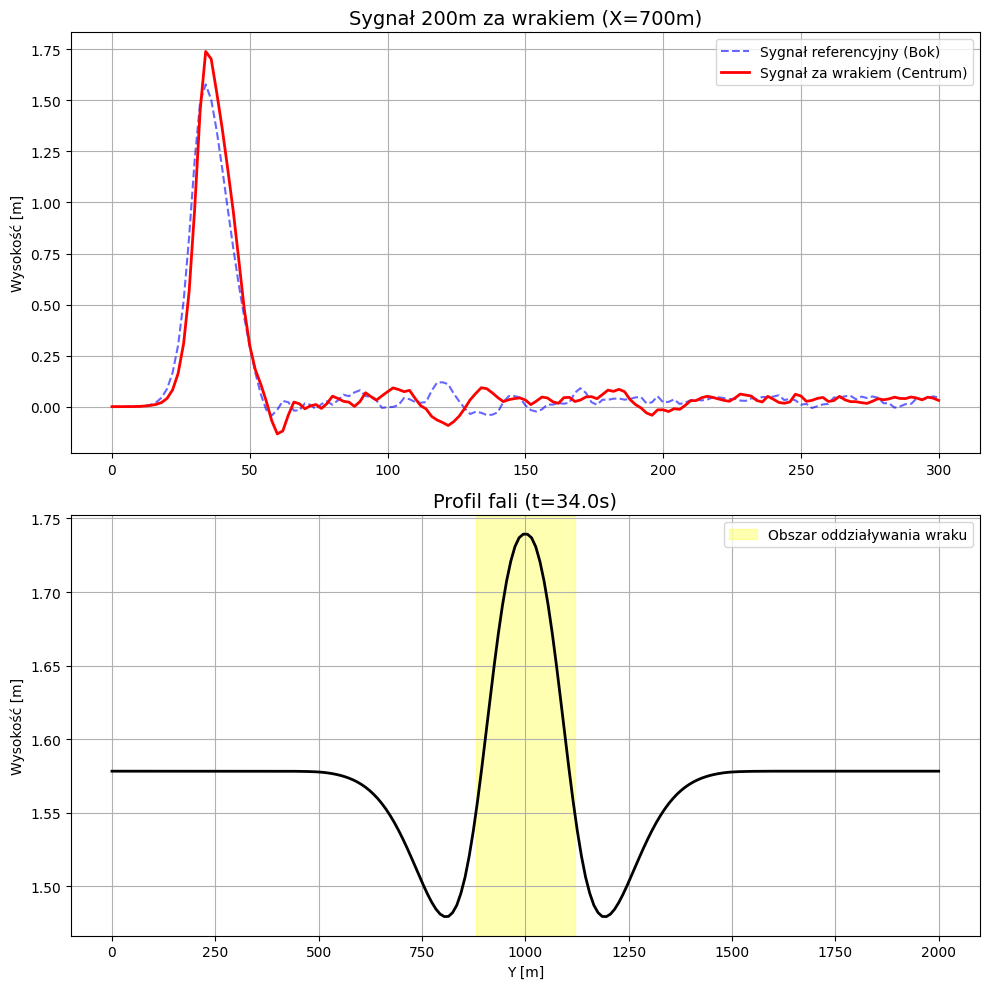

In [10]:
# 6. ANALIZA PROFILU ZA WRAKIEM

# aktualne wymiary
current_ny = output['h'][0].shape[1] 
y_plot = np.linspace(0, Ly, current_ny)

# 200m za wrakiem 
nx = int(Lx / dx_val)
sensor_x_pos = 700.0
sensor_idx_x = int(sensor_x_pos / dx_val)
sensor_idx_x = min(sensor_idx_x, nx - 1)

sensor_center_idx = current_ny // 2 
sensor_side_idx = 20 

signal_center = [frame[sensor_idx_x, sensor_center_idx] for frame in output['h']]
signal_side = [frame[sensor_idx_x, sensor_side_idx] for frame in output['h']]
depth_at_sensor = bathymetry[sensor_idx_x, 0] 

wave_center = np.array(signal_center) - depth_at_sensor
wave_side = np.array(signal_side) - depth_at_sensor
time_axis = np.arange(len(signal_center)) * output_interval * dt_val

fig, (ax1, ax2) = pyplot.subplots(2, 1, figsize=(10, 10), sharex=False)

# Wykres 1
ax1.plot(time_axis, wave_side, 'b--', label='Sygnał referencyjny (Bok)', alpha=0.6)
ax1.plot(time_axis, wave_center, 'r-', label='Sygnał za wrakiem (Centrum)', linewidth=2)
ax1.set_title(f"Sygnał 200m za wrakiem (X={sensor_x_pos:.0f}m)", fontsize=14)
ax1.set_ylabel("Wysokość [m]")
ax1.legend()
ax1.grid(True)

# Wykres 2
peak_time_idx = np.argmax(wave_center)
cross_section = output['h'][peak_time_idx][sensor_idx_x, :] - depth_at_sensor

ax2.plot(y_plot, cross_section, 'k-', linewidth=2)
visual_width = 4 * sigma_length 
ax2.axvspan(ship_y - visual_width/2, ship_y + visual_width/2, color='yellow', alpha=0.3, label='Obszar oddziaływania wraku')

ax2.set_title(f"Profil fali (t={time_axis[peak_time_idx]:.1f}s)", fontsize=14)
ax2.set_xlabel("Y [m]")
ax2.set_ylabel("Wysokość [m]")
ax2.legend()
ax2.grid(True)

pyplot.tight_layout()
pyplot.show()

Sprawdzono także wpływ zderzenia z wrakiem na fale krótko po zderzeniu (200m od wraku). Jako referencje wykorzystano wysokość fali z boku fali, gdyż tam jej oddziaływanie z wrakiem powinno być najmniejsze. Widać wyraźne różnice między tymi punktami, wysokość fali za statkiem uległa zwiększeniu względem punktu z boku osiągając prawie 1.75m. 

Fala dotarła do brzegu w t=246.0s
Maksymalna wysokość fali: 3.0983 m
Minimalna wysokość fali:  2.9306 m
Różnica: 16.7668 cm


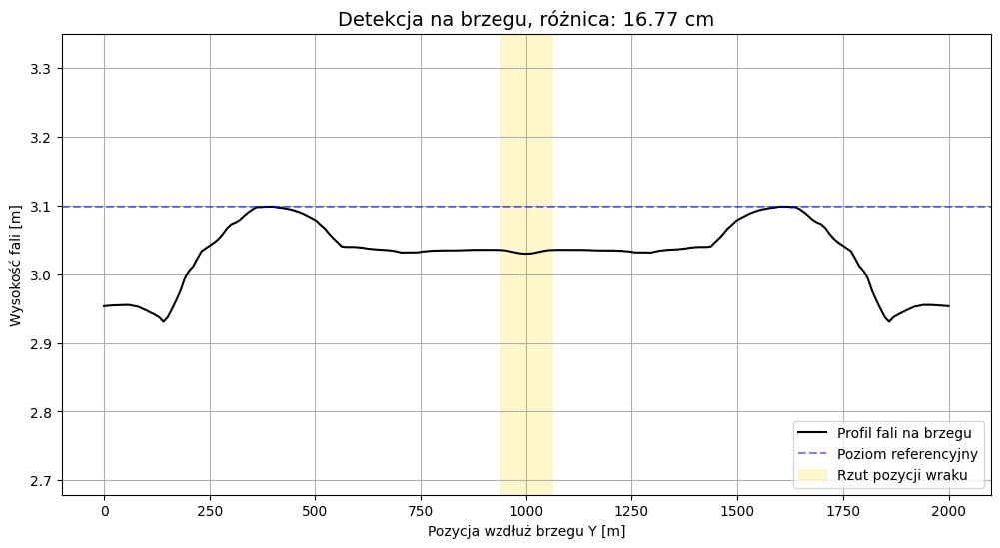

In [11]:
# 7. WYNIKI NA BRZEGU 

current_ny = output['h'][0].shape[1]
y_plot = np.linspace(0, Ly, current_ny)

# Punkt pomiarowy: BRZEG (X=3000m)
shore_idx = nx - 10 # Margines od końca siatki

# moment uderzenia fali w brzeg
wave_history = [frame[shore_idx, current_ny//2] for frame in output['h']]
peak_frame_idx = np.argmax(wave_history)
peak_time = peak_frame_idx * output_interval * dt_val

# profil poprzeczny na brzegu
cross_section_shore = output['h'][peak_frame_idx][shore_idx, :] - bathymetry[shore_idx, :]
reference_level = np.max(cross_section_shore) # Poziom fali z boków
min_level = np.min(cross_section_shore)       # Poziom w cieniu

signal_diff = reference_level - min_level

print(f"Fala dotarła do brzegu w t={peak_time:.1f}s")
print(f"Maksymalna wysokość fali: {reference_level:.4f} m")
print(f"Minimalna wysokość fali:  {min_level:.4f} m")
print(f"Różnica: {signal_diff*100:.4f} cm")

fig, ax = pyplot.subplots(figsize=(12, 6))

ax.plot(y_plot, cross_section_shore, 'k-', linewidth=1.5, label='Profil fali na brzegu')
ax.axhline(reference_level, color='blue', linestyle='--', alpha=0.5, label='Poziom referencyjny')

visual_width = 4 * sigma_width
ax.axvspan(ship_y - visual_width/2, ship_y + visual_width/2, color='gold', alpha=0.2, label='Rzut pozycji wraku')

margin = max(signal_diff * 1.5, 0.005) 
ax.set_ylim(min_level - margin, reference_level + margin)

ax.set_title(f"Detekcja na brzegu, różnica: {signal_diff*100:.2f} cm", fontsize=14)
ax.set_xlabel("Pozycja wzdłuż brzegu Y [m]")
ax.set_ylabel("Wysokość fali [m]")
ax.legend(loc='lower right')
ax.grid(True)

pyplot.show()

W przypadku gdyby fala nie natrafiła na przeszkodę kształt obserwowany na brzegu byłby linią prostą, w tym wypadku o wysokości $h=3.1m$. Zmiana wysokości fali wynika z faktu, że strumień energii fali musi pozostać zachowany. Gdy fala wchodzi na płytszą wodę i zwalnia, jej energia kinetyczna zamienia się w potencjalną. Z powodu zderzenia fali z wrakiem powstaje deformacja widoczna na rysunku powyżej, jest ona jednak bardzo mała i w praktyce nie byłaby zauważona przez osoby stojące na brzegu morza.

Podsumowanie:

Celem projektu było sprawdzenie, czy obserwując fale na brzegu, można wykryć leżący 2,5 km dalej wrak statku SS Richard Montgomery. Symulacja pokazała, że fala płynąca w stronę lądu znacznie urosła – z początkowych 1,5 metra do ponad 3 metrów – co jest faktycznym zjawiskiem, gdy woda staje się płytsza. W momencie przepływania nad wrakiem fala rzeczywiście zwolniła, co spowodowało powstanie lokalnego wgłębienia. Jednak ze względu na dużą odległość od brzegu, woda z sąsiednich obszarów zdążyła napłynąć i w dużej mierze wyrównać to zniekształcenie. Ostatecznie symulacja wykazała, że na brzegu różnica poziomu wody w miejscu "cienia" za statkiem wynosiła zaledwie kilkanaście centymetrów. Oznacza to, że choć fizycznie statek wpływa na kształt fali, to w rzeczywistych warunkach, przy 3-metrowych falach, taka różnica byłaby niemożliwa do zauważenia gołym okiem.